In [1]:
import os

# os.environ['HDF5_USE_FILE_LOCKING'] = 'FALSE'
# os.environ["CUDA_VISIBLE_DEVICES"]="1"

import numpy as np
import torch
import torch.utils.data
from PIL import Image

import cv2

import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

from glob import glob
from tqdm.autonotebook import tqdm

import torch.nn as nn
import torch.nn.functional as F

import open3d as o3d

import trimesh

import multiprocessing as mp

import yaml

import matplotlib.pyplot as plt

import h5py

import random

import roma

# from epd import *
from tqdm.autonotebook import tqdm
import scipy

device = 'cuda'

import copy

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


## Load Preprocessed Data

In [2]:
hf = h5py.File('processed_data_linemod.h5', 'r')
rgbs = hf['rgbs'][:]
depth_imgs = hf['depth_imgs'][:]
merged_masks = hf['merged_masks'][:]
point_cloud_pairs = np.load('point_cloud_pairs_linemod.npy',allow_pickle=True)
gt = np.load('linemod_gt.npy',allow_pickle=True).item()

In [3]:
name_to_mask_value = {"ape": 21,
                       "can": 106,
                       "cat": 128,
                       "driller": 170,
                       "duck": 191,
                       "eggbox": 213,
                       "glue": 234,
                       "holepuncher": 255}
class_to_name = {0: "ape", 1: "can", 2: "cat", 3: "driller", 4: "duck", 5: "eggbox", 6: "glue", 7: "holepuncher"}
name_to_id = {"ape": 1, "can": 5, "cat": 6, "driller": 8, "duck": 9, "eggbox": 10, "glue": 11, "holepuncher": 12}
id_to_name = {v: k for k, v in name_to_id.items()}
name_to_class = {v: k for k, v in class_to_name.items()}
obj_mask_value = {21: 1, 106: 5, 128: 6, 170: 8, 191: 9, 213: 10, 234: 11, 255: 12}
obj_to_mask_value = {v: k for k, v in obj_mask_value.items()}

reference_point_clouds = np.load('reference_point_clouds_linemod.npy',allow_pickle=True)

## Visualize Data

### Reference Point Clouds

In [4]:
scene = trimesh.Scene()
for i,pc in enumerate(reference_point_clouds):
    scene.add_geometry(trimesh.points.PointCloud(pc[0] + [i%6 * 300, i//6 * 300 ,0],colors=pc[1]))
scene.camera.z_far = 10
scene.show(viewer='notebook')

In [5]:
diameters = []
for i in range(len(reference_point_clouds)):
    diameters.append(float(torch.cdist(torch.Tensor(reference_point_clouds[i][0]),torch.Tensor(reference_point_clouds[i][0])).max().detach().numpy()))

### Sample Data

In [6]:
point_cloud_pair = point_cloud_pairs[np.random.choice(point_cloud_pairs.shape[0])]
rgb = rgbs[point_cloud_pair[-1]]
merged_mask = merged_masks[point_cloud_pair[-1]]
depth_img = depth_imgs[point_cloud_pair[-1]]

(-0.5, 639.5, 479.5, -0.5)

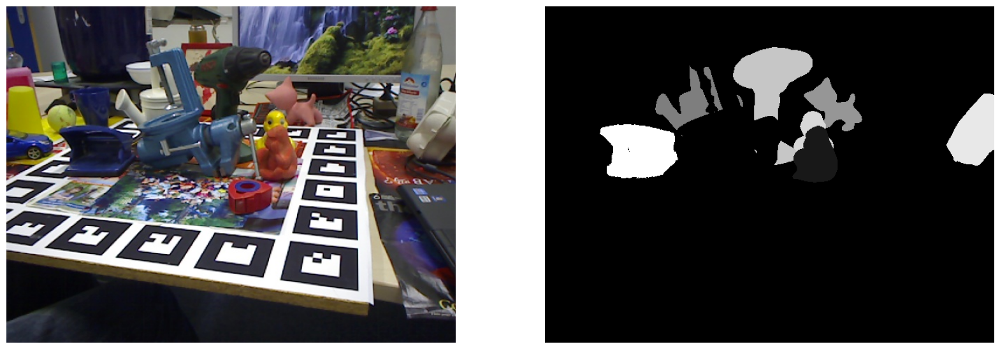

In [7]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(rgb)
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(merged_mask,cmap='Greys_r')
plt.axis('off')

In [8]:
scene = trimesh.Scene()
scene.add_geometry(trimesh.points.PointCloud(depth_img[:,:,0:3].reshape([-1,3]),colors=rgb.reshape([-1,3])))
scene.camera.z_far = 10
scene.show(viewer='notebook')

In [9]:
scene = trimesh.Scene()
obj_id_list = list(id_to_name.keys())

pc_source = trimesh.points.PointCloud(point_cloud_pair[0],colors=point_cloud_pair[1])
scene.add_geometry(pc_source)

r_pc = np.copy(reference_point_clouds[obj_id_list.index(point_cloud_pair[2])][0])
r_pc = (np.reshape(point_cloud_pair[3],(3,3)) @ r_pc.T).T + point_cloud_pair[4]
pc_target = trimesh.points.PointCloud(r_pc,colors=[0,255,0])
scene.add_geometry(pc_target)

scene.camera.z_far = 10
scene.show(viewer='notebook')

## Instance Segmentaion Training

In [10]:
class ManipulationDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(range(len(rgbs)))
        self.masks = list(range(len(rgbs)))
        
        self.obj_id_dict = {0: "ape", 1: "can", 2: "cat", 3: "driller", 4: "duck", 5: "eggbox", 6: "glue", 7: "holepuncher"}
        self.obj_mask_value = {21: 0, 106: 1, 128: 2, 170: 3, 191: 4, 213: 5, 234: 6, 255: 7}
        
        
    def __getitem__(self, idx):
        # load images ad masks
        # img_path = os.path.join(self.root, "rgb", self.imgs[idx])
        # mask_path = os.path.join(self.root, "merged_masks", self.masks[idx])
        img = torch.Tensor(np.transpose(rgbs[self.imgs[idx]],[2,0,1]))
        # note that we haven't converted the mask to RGB,
        # because each color corresponds to a different instance
        # with 0 being background
        mask = merged_masks[self.masks[idx]]

        # instances are encoded as different colors
        obj_ids = np.unique(mask)
        # first id is the background, so remove it
        obj_ids = obj_ids[1:]

        # split the color-encoded mask into a set
        # of binary masks
        masks = mask == obj_ids[:, None, None]
        
        
        
        # get bounding box coordinates for each mask
        num_objs = len(obj_ids)
        
        labels = torch.zeros((num_objs,), dtype=torch.int64)
        
        boxes = []
        for i in range(num_objs):
            pos = np.where(masks[i])
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            boxes.append([xmin, ymin, xmax, ymax])

            labels[i] = self.obj_mask_value[obj_ids[i]] + 1

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        
        masks = torch.as_tensor(masks, dtype=torch.uint8)

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["masks"] = masks
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            img, target = self.transforms(img, target)
        
        img = img.to(torch.float32)/255.0
        
        # Normalizer = torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        
        return img, target

    def __len__(self):
        return len(self.imgs)

In [11]:
def build_model(num_classes):
    # load an instance segmentation model pre-trained on COCO
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # Stop here if you are fine-tunning Faster-RCNN

    # now get the number of input features for the mask classifier
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    # and replace the mask predictor with a new one
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask,
                                                       hidden_layer,
                                                       num_classes)

    return model

In [12]:
train = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 62, 64, 66, 67, 68, 69, 70, 73, 74, 75, 77, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 93, 94, 96, 97, 98, 100, 101, 102, 104, 105, 107, 108, 109, 110, 111, 112, 113, 114, 115, 117, 118, 119, 120, 121, 122, 124, 125, 126, 127, 128, 129, 131, 132, 133, 135, 136, 137, 138, 140, 141, 142, 143, 144, 145, 147, 148, 149, 150, 151, 154, 156, 159, 160, 162, 164, 165, 166, 168, 169, 170, 171, 173, 175, 176, 177, 178, 179, 180, 181, 182, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 215, 216, 217, 218, 219, 220, 222, 223, 224, 225, 227, 228, 229, 230, 231, 232, 233, 234, 236, 237, 238, 240, 241, 242, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 272, 273, 275, 276, 278, 279, 280, 281, 282, 283, 284, 285, 287, 288, 289, 290, 292, 293, 295, 296, 297, 298, 299, 300, 301, 303, 304, 305, 306, 308, 309, 310, 311, 312, 313, 315, 316, 317, 318, 319, 321, 322, 323, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 348, 349, 351, 352, 353, 354, 356, 357, 358, 359, 360, 361, 362, 363, 365, 366, 368, 370, 371, 372, 373, 374, 375, 378, 380, 381, 382, 385, 386, 388, 389, 390, 391, 392, 393, 395, 396, 397, 398, 399, 400, 401, 403, 404, 405, 407, 408, 409, 411, 412, 414, 415, 416, 417, 418, 419, 420, 421, 423, 424, 426, 427, 428, 429, 431, 432, 433, 435, 436, 437, 438, 439, 440, 442, 443, 444, 445, 447, 448, 449, 450, 452, 453, 454, 455, 457, 458, 459, 460, 462, 463, 464, 466, 467, 468, 469, 470, 472, 473, 474, 475, 476, 477, 478, 479, 481, 482, 484, 485, 486, 487, 488, 489, 490, 491, 492, 494, 495, 497, 499, 500, 501, 502, 503, 504, 505, 506, 508, 509, 510, 511, 513, 514, 515, 516, 517, 518, 519, 520, 521, 522, 523, 524, 526, 528, 529, 530, 531, 535, 536, 537, 538, 540, 541, 542, 543, 544, 545, 546, 547, 548, 549, 550, 551, 552, 553, 555, 557, 558, 559, 560, 561, 562, 563, 564, 565, 566, 567, 569, 570, 572, 574, 575, 577, 578, 579, 580, 581, 582, 583, 584, 585, 586, 587, 588, 589, 590, 591, 592, 593, 594, 595, 596, 597, 599, 600, 601, 602, 605, 606, 607, 608, 610, 611, 612, 613, 614, 615, 616, 617, 618, 619, 620, 621, 622, 623, 624, 625, 626, 628, 629, 630, 631, 632, 633, 634, 636, 637, 638, 639, 640, 642, 643, 644, 645, 646, 647, 648, 650, 651, 652, 654, 655, 657, 658, 660, 661, 662, 663, 664, 665, 666, 667, 669, 670, 671, 672, 673, 674, 675, 677, 678, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 693, 694, 695, 696, 698, 699, 700, 701, 702, 703, 704, 705, 707, 708, 709, 710, 711, 712, 713, 714, 716, 718, 719, 720, 721, 722, 723, 724, 725, 727, 728, 729, 730, 731, 732, 733, 734, 736, 737, 738, 739, 740, 741, 742, 743, 745, 746, 748, 749, 750, 751, 753, 754, 755, 756, 757, 759, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 773, 774, 776, 777, 778, 779, 781, 782, 783, 784, 786, 787, 788, 789, 790, 791, 792, 793, 794, 795, 796, 797, 798, 799, 801, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 829, 830, 831, 832, 833, 834, 835, 836, 838, 839, 840, 841, 843, 844, 846, 848, 849, 851, 852, 853, 854, 855, 856, 857, 858, 860, 861, 862, 863, 864, 865, 866, 867, 868, 869, 870, 871, 872, 873, 874, 876, 877, 878, 879, 881, 882, 884, 885, 886, 887, 888, 889, 890, 893, 894, 895, 896, 897, 898, 899, 900, 901, 902, 903, 904, 905, 906, 907, 908, 909, 910, 911, 912, 913, 914, 917, 918, 919, 920, 921, 922, 924, 925, 926, 927, 928, 929, 930, 932, 934, 935, 936, 937, 938, 939, 940, 942, 943, 944, 946, 947, 948, 949, 950, 951, 952, 953, 955, 956, 957, 958, 960, 961, 962, 963, 965, 966, 967, 968, 969, 970, 971, 972, 973, 974, 976, 977, 978, 979, 980, 981, 982, 983, 984, 985, 986, 988, 989, 990, 991, 992, 993, 994, 995, 996, 997, 998, 999, 1000, 1001, 1003, 1004, 1005, 1006, 1007, 1008, 1009, 1010, 1011, 1012, 1013, 1015, 1016, 1017, 1018, 1019, 1021, 1022, 1023, 1025, 1026, 1027, 1028, 1029, 1030, 1031, 1032, 1033, 1034, 1035, 1036, 1037, 1039, 1041, 1042, 1043, 1044, 1045, 1046, 1047, 1049, 1050, 1051, 1052, 1053, 1054, 1055, 1056, 1057, 1058, 1059, 1060, 1061, 1062, 1063, 1064, 1065, 1067, 1068, 1069, 1070, 1072, 1073, 1074, 1075, 1076, 1077, 1078, 1079, 1080, 1082, 1083, 1085, 1086, 1087, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1104, 1105, 1107, 1108, 1109, 1110, 1111, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1122, 1123, 1124, 1125, 1126, 1127, 1128, 1130, 1131, 1132, 1134, 1137, 1138, 1139, 1140, 1141, 1142, 1143, 1144, 1145, 1146, 1147, 1148, 1149, 1150, 1151, 1152, 1153, 1154, 1155, 1156, 1158, 1160, 1161, 1162, 1164, 1165, 1166, 1167, 1168, 1169, 1170, 1173, 1175, 1176, 1177, 1178, 1179, 1180, 1181, 1182, 1183, 1184, 1185, 1186, 1187, 1188, 1189, 1190, 1192, 1193, 1194, 1195, 1196, 1197, 1199, 1200, 1201, 1202, 1203, 1204, 1206, 1207, 1208, 1209, 1210, 1211, 1212, 1213]
test = [24, 30, 45, 53, 63, 65, 71, 72, 76, 78, 91, 92, 95, 99, 103, 106, 116, 123, 130, 134, 139, 146, 152, 153, 155, 157, 158, 161, 163, 167, 172, 174, 183, 200, 214, 221, 226, 235, 239, 243, 271, 274, 277, 286, 291, 294, 302, 307, 314, 320, 324, 347, 350, 355, 364, 367, 369, 376, 377, 379, 383, 384, 387, 394, 402, 406, 410, 413, 422, 425, 430, 434, 441, 446, 451, 456, 461, 465, 471, 480, 483, 493, 496, 498, 507, 512, 525, 527, 532, 533, 534, 539, 554, 556, 568, 571, 573, 576, 598, 603, 604, 609, 627, 635, 641, 649, 653, 656, 659, 668, 676, 692, 697, 706, 715, 717, 726, 735, 744, 747, 752, 758, 760, 772, 775, 780, 785, 800, 802, 828, 837, 842, 845, 847, 850, 859, 875, 880, 883, 915, 916, 923, 931, 933, 941, 945, 954, 959, 964, 975, 987, 1002, 1014, 1020, 1024, 1038, 1040, 1048, 1066, 1071, 1081, 1084, 1088, 1102, 1103, 1106, 1112, 1121, 1129, 1133, 1135, 1136, 1157, 1159, 1163, 1171, 1172, 1174, 1191, 1198, 1205]

In [13]:
from engine import train_one_epoch, evaluate
import utils
import transforms as T


def get_transform(train):
    transforms = []
    # converts the image, a PIL image, into a PyTorch Tensor
    if train:
        # during training, randomly flip the training images
        # and ground-truth for data augmentation
        transforms.append(T.RandomHorizontalFlip(0.5))
    
    return T.Compose(transforms)


dataset = ManipulationDataset('../manipulation/dataset/', get_transform(train=True))
dataset_test = ManipulationDataset('../manipulation/dataset/', get_transform(train=False))

torch.manual_seed(1)
dataset = torch.utils.data.Subset(dataset, train)
dataset_test = torch.utils.data.Subset(dataset_test, test)

data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=16, shuffle=True, num_workers=4,
    collate_fn=utils.collate_fn)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=16, shuffle=False, num_workers=4,
    collate_fn=utils.collate_fn)

In [14]:
device = torch.device(device) if torch.cuda.is_available() else torch.device('cpu')

num_classes = 9

model = build_model(num_classes)
model.to(device)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(params, lr=1e-3)

lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=30,
                                               gamma=0.1)

/home/johnson/anaconda3/envs/torch_env/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/johnson/anaconda3/envs/torch_env/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [15]:
# number of epochs
# num_epochs = 100

# for epoch in range(num_epochs):
#     train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=100000, epoch_length=int(split/16))
#     lr_scheduler.step()
#     evaluate(model, data_loader_test, device=device)
model = torch.load('mask-rcnn-linemod.pt')

In [16]:
model.eval()
CLASS_NAMES = ['__background__', 
               "ape",
               "can",
               "cat",
               "driller",
               "duck",
               "eggbox",
               "glue",
               "holepuncher"]
device = torch.device(device) if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [17]:
def get_coloured_mask(mask):
    """
    random_colour_masks
      parameters:
        - image - predicted masks
      method:
        - the masks of each predicted object is given random colour for visualization
    """
    colours = [[0, 255, 0],[0, 0, 255],[255, 0, 0],[0, 255, 255],[255, 255, 0],[255, 0, 255],[80, 70, 180],[250, 80, 190],[245, 145, 50],[70, 150, 250],[50, 190, 190]]
    r = np.zeros_like(mask).astype(np.uint8)
    g = np.zeros_like(mask).astype(np.uint8)
    b = np.zeros_like(mask).astype(np.uint8)
    r[mask == 1], g[mask == 1], b[mask == 1] = colours[random.randrange(0,10)]
    coloured_mask = np.stack([r, g, b], axis=2)
    return coloured_mask

def get_prediction(img, confidence):
    """
    get_prediction
      parameters:
        - img_path - path of the input image
        - confidence - threshold to keep the prediction or not
      method:
        - Image is obtained from the image path
        - the image is converted to image tensor using PyTorch's Transforms
        - image is passed through the model to get the predictions
        - masks, classes and bounding boxes are obtained from the model and soft masks are made binary(0 or 1) on masks
          ie: eg. segment of cat is made 1 and rest of the image is made 0
    
    """

    img = img.to(device)
    pred = model([img])
    pred_score = list(pred[0]['scores'].detach().cpu().numpy())
    pred_t = [pred_score.index(x) for x in pred_score if x>confidence][-1]
    masks = (pred[0]['masks']>0.5).squeeze().detach().cpu().numpy()
    pred_class = [CLASS_NAMES[i] for i in list(pred[0]['labels'].cpu().numpy())]
    pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().cpu().numpy())]
    masks = masks[:pred_t+1]
    pred_boxes = pred_boxes[:pred_t+1]
    pred_class = pred_class[:pred_t+1]
    pred_labels = pred[0]['labels'].cpu().numpy()[:pred_t+1]
    return masks, pred_boxes, pred_class, pred_labels

def segment_instance(img, rgb_img, confidence=0.5, rect_th=2, text_size=0.75, text_th=2):
    """
    segment_instance
      parameters:
        - img_path - path to input image
        - confidence- confidence to keep the prediction or not
        - rect_th - rect thickness
        - text_size
        - text_th - text thickness
      method:
        - prediction is obtained by get_prediction
        - each mask is given random color
        - each mask is added to the image in the ration 1:0.8 with opencv
        - final output is displayed
    """
    masks, boxes, pred_cls,_ = get_prediction(img, confidence)
    img = rgb_img
    for i in range(len(masks)):
        rgb_mask = get_coloured_mask(masks[i])
        img = cv2.addWeighted(img, 1, rgb_mask, 0.5, 0)
        cv2.rectangle(img, [int(boxes[i][0][0]),int(boxes[i][0][1])],[int(boxes[i][1][0]),int(boxes[i][1][1])],color=(0, 255, 0), thickness=rect_th)
        cv2.putText(img,pred_cls[i], [int(boxes[i][0][0]),int(boxes[i][0][1])], cv2.FONT_HERSHEY_SIMPLEX, text_size, (0,255,0),thickness=text_th)
    plt.figure(figsize=(10,15))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()

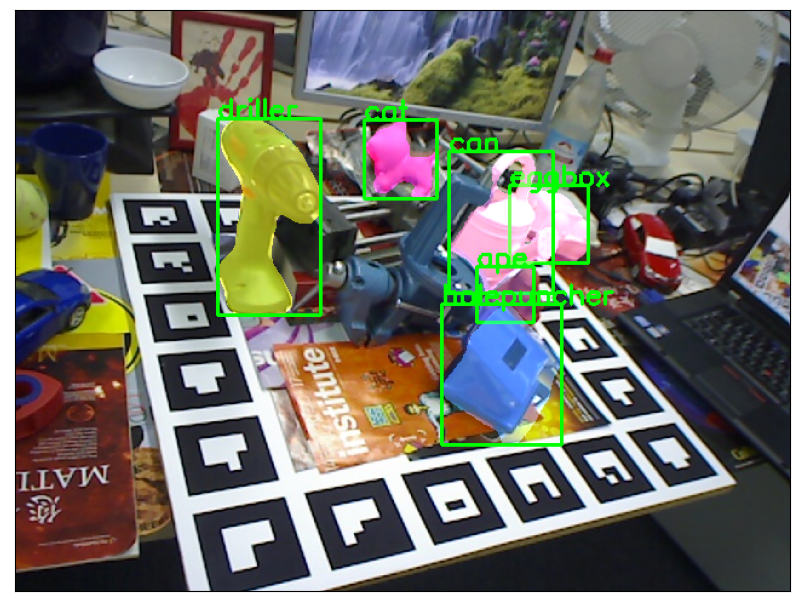

In [18]:
rand_i = np.random.choice(len(test))
segment_instance(dataset_test[rand_i][0],rgbs[test[rand_i]],confidence=0.7)

## Pose Prediction Model

### FGR and RANSAC

In [19]:
confidence = 0.7
pred_masks = []
pred_obj_id = []
sub_pcs = []
for i,t in enumerate(tqdm(test)):
    masks, pred_boxes, pred_class,pred_label = get_prediction(dataset_test[i][0], confidence)
    
    pred_masks.append(masks)
    pred_obj_id.append(pred_label)
    
    
    rgb = rgbs[t]
    depth =depth_imgs[t]
    
    for j,mask in enumerate(masks):
        pc = depth[mask]
        pc = pc[np.logical_not(pc[:,-1]==0.0)] 
        sub_pcs.append([pc,pred_label[j],t])

  0%|          | 0/181 [00:00<?, ?it/s]

In [69]:
predicted_poses_fgr = {}
predicted_poses_ransac = {}
for mpc in tqdm(sub_pcs):
    if mpc[0].shape[0] > 0:
        if not mpc[-1] in predicted_poses_fgr.keys():
            predicted_poses_fgr[mpc[-1]] = []
            predicted_poses_ransac[mpc[-1]] = []

        source = o3d.geometry.PointCloud()
        source.points = o3d.utility.Vector3dVector((mpc[0]-mpc[0].min(0))/1000.0)
        target = o3d.geometry.PointCloud()
        target.points = o3d.utility.Vector3dVector(reference_point_clouds[mpc[1]-1][0]/1000.0)
        target_down = target.voxel_down_sample(0.002)


        target_down.estimate_normals(o3d.geometry.KDTreeSearchParamHybrid(radius=1.0, max_nn=10))
        source.estimate_normals(o3d.geometry.KDTreeSearchParamHybrid(radius=1.0, max_nn=10))

        target_fpfh = o3d.pipelines.registration.compute_fpfh_feature(target_down, o3d.geometry.KDTreeSearchParamHybrid(radius=1.0, max_nn=30))
        source_fpfh = o3d.pipelines.registration.compute_fpfh_feature(source, o3d.geometry.KDTreeSearchParamHybrid(radius=1.0, max_nn=30))

        distance_threshold = 0.002

        result = o3d.pipelines.registration.registration_ransac_based_on_feature_matching(
                target_down, source, target_fpfh, source_fpfh, True,
                distance_threshold,
                o3d.pipelines.registration.TransformationEstimationPointToPoint(False),
                3, [
                    o3d.pipelines.registration.CorrespondenceCheckerBasedOnEdgeLength(
                        0.9),
                    o3d.pipelines.registration.CorrespondenceCheckerBasedOnDistance(
                        distance_threshold)
                ], o3d.pipelines.registration.RANSACConvergenceCriteria(100000, 0.99))


        result = o3d.pipelines.registration.registration_icp(
                target_down, source, distance_threshold, result.transformation,
                o3d.pipelines.registration.TransformationEstimationPointToPlane())

        R = result.transformation[0:3,0:3]
        t = 1000.0*result.transformation[0:3,-1] + mpc[0].min(0)

        predicted_poses_ransac[mpc[-1]].append([R,t,mpc[1],obj_id_list[mpc[1]-1]])

        try:
            result = o3d.pipelines.registration.registration_fgr_based_on_feature_matching(
                    target_down, source, target_fpfh, source_fpfh,
                    o3d.pipelines.registration.FastGlobalRegistrationOption(
                        maximum_correspondence_distance=distance_threshold))

            result = o3d.pipelines.registration.registration_icp(
                    target_down, source, distance_threshold, result.transformation,
                    o3d.pipelines.registration.TransformationEstimationPointToPlane())

            R = result.transformation[0:3,0:3]
            t = 1000.0*result.transformation[0:3,-1]+ mpc[0].min(0)

            predicted_poses_fgr[mpc[-1]].append([R,t,mpc[1],obj_id_list[mpc[1]-1]])
        except:
            print('E!')

  0%|          | 0/1337 [00:00<?, ?it/s]

E!
E!


In [70]:
ADD_fgr = 0.0
ADD_ransac = 0.0
count = 0
sym = [11,10]

for k in tqdm(predicted_poses_fgr.keys()):
    
    gt_classes = []
    gt_poses = []
    for g_p in gt[k]:
        gt_classes.append(g_p['obj_id'])
        gt_poses.append([np.reshape(g_p['cam_R_m2c'],[3,3]),np.array(g_p['cam_t_m2c'])])
        count += 1
    
    for p_p in predicted_poses_fgr[k]:
        if p_p[-1] in gt_classes:
            R_p = p_p[0]
            t_P = p_p[1]
            idx = gt_classes.index(p_p[-1])
            R = gt_poses[idx][0]
            t = gt_poses[idx][1]
            
            ref_pc = reference_point_clouds[p_p[-2]-1][0]
            
            target = (R @ ref_pc.T).T + t
            pred = (R_p @ ref_pc.T).T + t_P
            
            if p_p[-1] in sym:
                L_p = torch.cdist(torch.Tensor(target).to(device),torch.Tensor(pred).to(device)).min(-1)[0].mean()
                L_p = L_p.cpu().detach().numpy()
            else:
                L_p = np.linalg.norm(target-pred,axis=-1).mean()
                
            if L_p <= 0.1 * diameters[p_p[-2]-1]:
                ADD_fgr += 1
    
    for p_p in predicted_poses_ransac[k]:
        if p_p[-1] in gt_classes:
            R_p = p_p[0]
            t_P = p_p[1]
            idx = gt_classes.index(p_p[-1])
            R = gt_poses[idx][0]
            t = gt_poses[idx][1]
            
            ref_pc = reference_point_clouds[p_p[-2]-1][0]
            
            target = (R@ref_pc.T).T + t
            pred = (R_p@ref_pc.T).T + t_P
            
            if p_p[-1] in sym:
                L_p = torch.cdist(torch.Tensor(target).to(device),torch.Tensor(pred).to(device)).min(-1)[0].mean()
                L_p = L_p.cpu().detach().numpy()
            else:
                L_p = np.linalg.norm(target-pred,axis=-1).mean()
                
            if L_p <= 0.1 * diameters[p_p[-2]-1]:
                ADD_ransac += 1
                
print('RANSAC ADD(-S): %f' % (ADD_ransac/count))
print('FGR ADD(-S): %f' % (ADD_fgr/count))

  0%|          | 0/181 [00:00<?, ?it/s]

RANSAC ADD(-S): 0.093810
FGR ADD(-S): 0.072112


### Super 4PCs

In [48]:
import subprocess

os.system('rm -r ./Super4PCs/temp/')
os.system('mkdir ./Super4PCs/temp/')

0

In [49]:
predicted_poses_4PCs = {}
to_do = []
for i,mpc in enumerate(tqdm(sub_pcs)):
    if mpc[0].shape[0] > 0:

        source = o3d.geometry.PointCloud()
        source.points = o3d.utility.Vector3dVector((mpc[0]-mpc[0].min(0))/1000.0)
        source.estimate_normals(o3d.geometry.KDTreeSearchParamHybrid(radius=1.0, max_nn=10))

        normals = np.array(source.normals)
        normals[normals[:,-1]>0] *= -1 
        source.normals = o3d.utility.Vector3dVector(normals)

        radii = [0.001, 0.002, 0.004, 0.01]
        rec_mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_ball_pivoting(
            source, o3d.utility.DoubleVector(radii))
        o3d.io.write_triangle_mesh('./Super4PCs/temp/mpc_%i.obj'%i,rec_mesh)
        to_do.append(i)

  0%|          | 0/1337 [00:00<?, ?it/s]

[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write O

In [50]:
def process_mcp(i):
    mpc = sub_pcs[i]
    result = subprocess.run(('./Super4PCs/Super4PCS -i ./Super4PCs/temp/mpc_%i.obj ./Super4PCs/PreProcessedMeshes/Linemod/obj_%02d.obj -o 0.7 -t 20 -d 0.01 -n 150'%(i,obj_id_list[mpc[1]-1])).split(), stdout=subprocess.PIPE)
    T = str(result.stdout).split('.obj:')[1].split('\\n')[1:5]
    T_final = []
    for t in T:
        T_final.append([])
        for v in t.split():
            T_final[-1].append(float(v))
    T_final = np.array(T_final)
    
    R = T_final[0:3,0:3]
    t = 1000.0*T_final[0:3,-1] + mpc[0].min(0)
    
    return [R,t,mpc[1],obj_id_list[mpc[1]-1]],mpc[-1]

In [51]:
def run_imap_multiprocessing(func, argument_list, show_prog = True):
    pool = mp.Pool(processes=mp.cpu_count())
    
    if show_prog:            
        result_list_tqdm = []
        for result in tqdm(pool.imap(func=func, iterable=argument_list), total=len(argument_list),position=0, leave=True):
            result_list_tqdm.append(result)
    else:
        result_list_tqdm = []
        for result in pool.imap(func=func, iterable=argument_list):
            result_list_tqdm.append(result)

    return result_list_tqdm

In [52]:
computed = run_imap_multiprocessing(process_mcp,to_do)

  0%|          | 0/1335 [00:00<?, ?it/s]

In [57]:
predicted_poses_4pcs = {}
for idx,i in enumerate(tqdm(to_do)):
    mpc = sub_pcs[i]
    if mpc[0].shape[0] > 0:
        if not mpc[-1] in predicted_poses_4pcs.keys():
            predicted_poses_4pcs[mpc[-1]] = []

        R,t, _,_, = computed[idx][0]

        predicted_poses_4pcs[mpc[-1]].append([R,t,mpc[1],obj_id_list[mpc[1]-1]])

  0%|          | 0/1335 [00:00<?, ?it/s]

In [59]:
ADD_4pcs = 0.0
count = 0
sym = [11,10]

for k in tqdm(predicted_poses_4pcs.keys()):
    
    gt_classes = []
    gt_poses = []
    for g_p in gt[k]:
        gt_classes.append(g_p['obj_id'])
        gt_poses.append([np.reshape(g_p['cam_R_m2c'],[3,3]),np.array(g_p['cam_t_m2c'])])
        count += 1
    
    for p_p in predicted_poses_4pcs[k]:
        if p_p[-1] in gt_classes:
            R_p = p_p[0]
            t_P = p_p[1]
            idx = gt_classes.index(p_p[-1])
            R = gt_poses[idx][0]
            t = gt_poses[idx][1]
            
            ref_pc = reference_point_clouds[p_p[-2]-1][0]
            
            target = (R @ ref_pc.T).T + t
            pred = (R_p @ ref_pc.T).T + t_P
            
            if p_p[-1] in sym:
                L_p = torch.cdist(torch.Tensor(target).to(device),torch.Tensor(pred).to(device)).min(-1)[0].mean()
                L_p = L_p.cpu().detach().numpy()
            else:
                L_p = np.linalg.norm(target-pred,axis=-1).mean()
                
            if L_p <= 0.1 * diameters[p_p[-2]-1]:
                ADD_4pcs += 1
    
                
print('Super4PCs ADD(-S): %f' % (ADD_4pcs/count))

  0%|          | 0/181 [00:00<?, ?it/s]

Super4PCs ADD(-S): 0.403318
